# CW1 Answers

## Q1
Study: what is the just noticeable difference (JND)?
Regarding a healthy human visual system,
1. How many gray levels can we detect?
2. How many Red, Green, and Blue colors?

- The just noticeable difference (JND), also known as the difference threshold, is the minimum level of stimulation that a person can detect 50% of the time. 
- Humans Can Only Distinguish Between About 30 Shades of Gray. Our visual system would be adapted to the brightness of the scene, and detect a few shades lighter and darker than the average gray shade.
- There are different claims, mostly it is believed that we can distinguish 100 different red/blue/green shades, so the average number of colors we can distinguish is around a million. 100\*100\*100.

## Q2
Study: Why is the sky blue? Why is it orange/red at
dusk/sunset?

_See the slides for lab 3_

## Q3
Load the image using a Python program, then show the
image and its R, G, and B channels. Compute the power of
each channel. DTR.
1. carpixel‐1976‐ferrari‐512‐bb‐.jpg
2. cat.bmp

In [1]:
import cv2     # open cv 2 package
import numpy as np
import matplotlib.pyplot as plt

from utils import *

In [2]:
def q3(im_path):
    img = plt.imread(im_path) # imread using matplotlib.pyplot instead of opencv
    fig, axs = plt.subplots(2,2, figsize=(30,20))

    axs[0,0].set_title(f"original power: {(img.astype(np.float32)**2).mean()}" ,fontsize = 44)
    axs[0,0].imshow(img)
    axs[0,1].imshow(img[:,:,0], cmap='gray') # plt follows RGB instead of BGR
    axs[0,1].set_title(f"Red power: {(img[:,:,0].astype(np.float32)**2).mean()}" ,fontsize = 44)
    axs[1,0].imshow(img[:,:,1], cmap='gray')
    axs[1,0].set_title(f"Green power: {(img[:,:,1].astype(np.float32)**2).mean()}" ,fontsize = 44)
    axs[1,1].imshow(img[:,:,2], cmap='gray')
    axs[1,1].set_title(f"Blue power: {(img[:,:,2].astype(np.float32)**2).mean()}" ,fontsize = 44)
    plt.tight_layout()
    

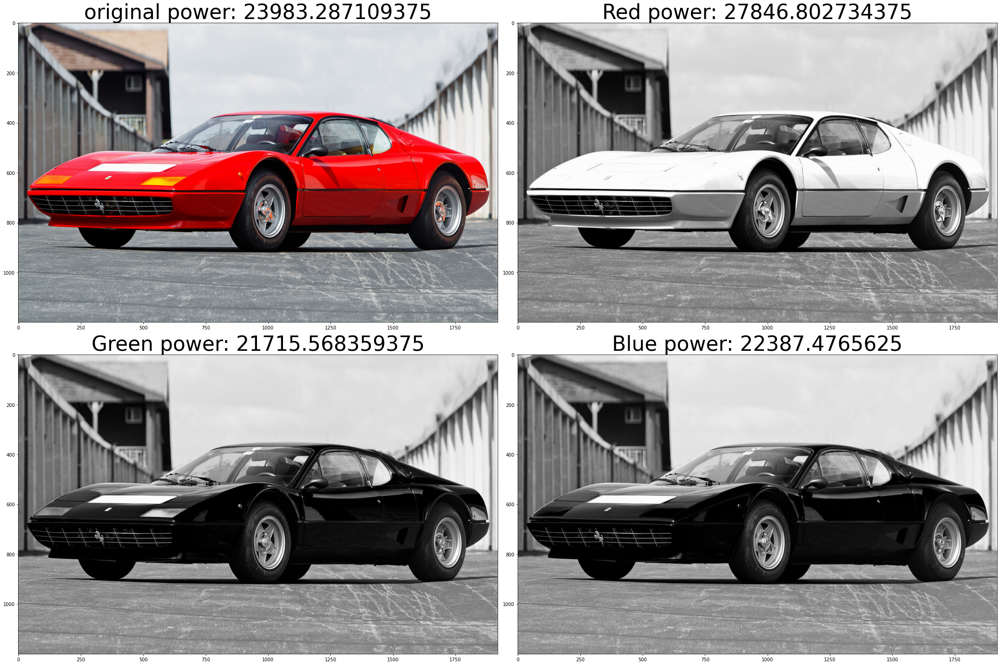

In [3]:
q3("carpixel-1976-ferrari-512-bb-.jpg")

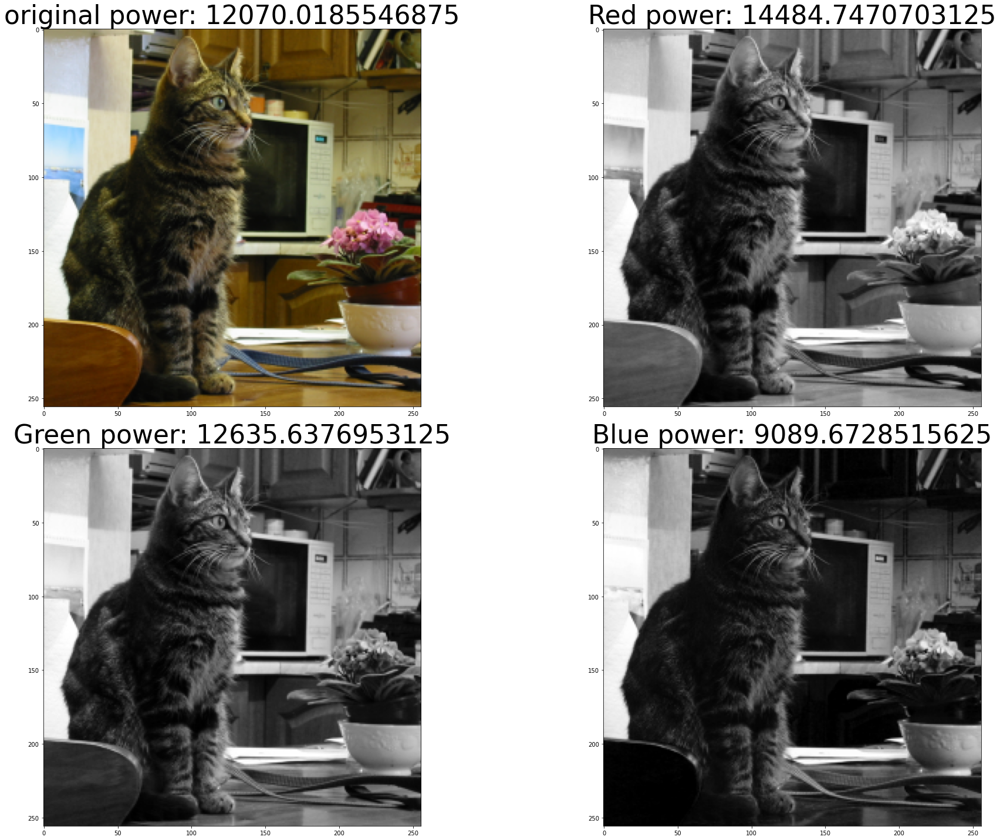

In [6]:
q3("cat.bmp")

In [7]:
im_path = "carpixel-1976-ferrari-512-bb-.jpg"
img = plt.imread(im_path)
am_power(img), am_power(img[:,:,0]), am_power(img[:,:,1]), am_power(img[:,:,2])

(23983.280039351852, 27846.79942578125, 21715.56368532986, 22387.477006944446)

In [8]:
im_path = "cat.bmp"
img = plt.imread(im_path)
am_power(img), am_power(img[:,:,0]), am_power(img[:,:,1]), am_power(img[:,:,2])

(12070.01914469401, 14484.7470703125, 12635.6376953125, 9089.672668457031)

## Q4
Convert the Question 3 images to grayscale and show the
results

In [4]:
def q4(im_path):
    img = cv2.imread(im_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_plt = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, axs = plt.subplots(1,2, figsize=(15,20))
    axs[0].set_title(f"original" ,fontsize = 34)
    axs[0].imshow(img_plt)
    axs[1].imshow(img_gray, cmap='gray')
    axs[1].set_title(f"Gray" ,fontsize = 34)
    plt.tight_layout()
    
    return img_gray

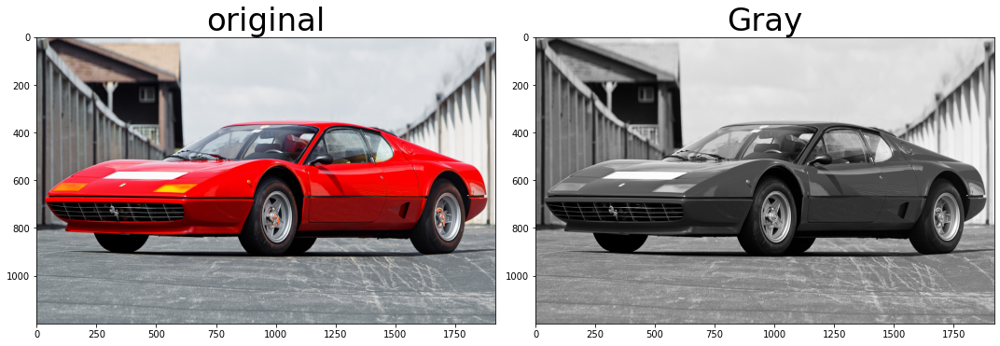

In [5]:
car_gray = q4("carpixel-1976-ferrari-512-bb-.jpg")

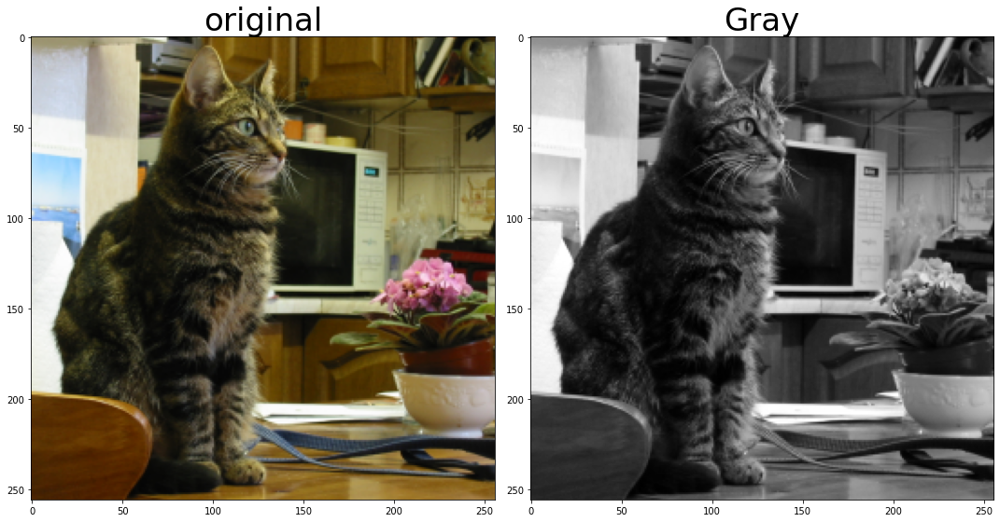

In [6]:
cat_gray = q4("cat.bmp")

## Q5
Draw the histogram of both Q3 grayscale images, and find
the dynamic range as well.

In [7]:
def q5(img_gray):
    hist, bins = np.histogram(img_gray.flatten(), 256, [0, 256])

    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    plt.title(f'Dynamic range is between {img_gray.min()} and {img_gray.max()}')

    plt.plot(cdf_normalized)
    plt.hist(img_gray.flatten(), 256, [0, 256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.show()


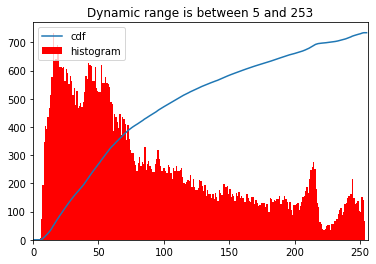

In [8]:
q5(cat_gray)

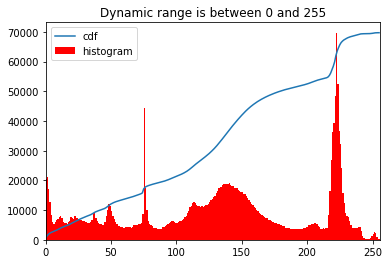

In [9]:
q5(car_gray)

## Q6
Use histograms, convert both images to 16,4, and 2 gray
levels and show the results. DTR.

In [10]:
def q6(img_gray, target_gl):
    source_gl = 256
    n_pixels = img_gray.size # size = np.prod(shape) = M * N
    cff = n_pixels / target_gl
    M = img_gray.shape

    # image histogram
    hist,bins = np.histogram(img_gray.flatten(), source_gl, [0,source_gl])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    # graylevel reduction based on equalization
    output_img = np.ones_like(img_gray) * (source_gl-1)
    acc = 0
    lb = 0
    for i in range(source_gl):
        acc = acc + hist[i] 
        if acc>=cff:
            for mm in range(M[0]):
                for nn in range(M[1]):
                    if lb<=img_gray[mm][nn]<=i:
                        output_img[mm][nn]=lb
            acc = 0
            lb = i+1

    hist2,bins2 = np.histogram(output_img.flatten(), source_gl, [0,source_gl])

    cdf2 = hist2.cumsum()
    cdf_normalized2 = cdf2 * hist2.max() / cdf2.max()


    fig, axs = plt.subplots(2,2, figsize=(15,15))
    axs[0,0].set_title(f"Gray original" ,fontsize = 34)
    axs[0,0].imshow(img_gray, cmap='gray')

    axs[0,1].set_title(f"Histogram original" ,fontsize = 34)
    axs[0,1].plot(cdf_normalized)
    axs[0,1].hist(img_gray.flatten(), 255, [0,255], color = 'r')
    axs[0,1].legend(('cdf','histogram'), loc = 'upper left')
    axs[1,0].set_title(f"Gray {target_gl}" ,fontsize = 34)
    axs[1,0].imshow(output_img, cmap='gray')
    axs[1,1].set_title(f"Histogram {target_gl}" ,fontsize = 34)
    axs[1,1].plot(cdf_normalized2)
    axs[1,1].hist(output_img.flatten(), 255, [0,255], color = 'r')
    axs[1,1].legend(('cdf','histogram'), loc = 'upper left')
    plt.tight_layout()


    return output_img

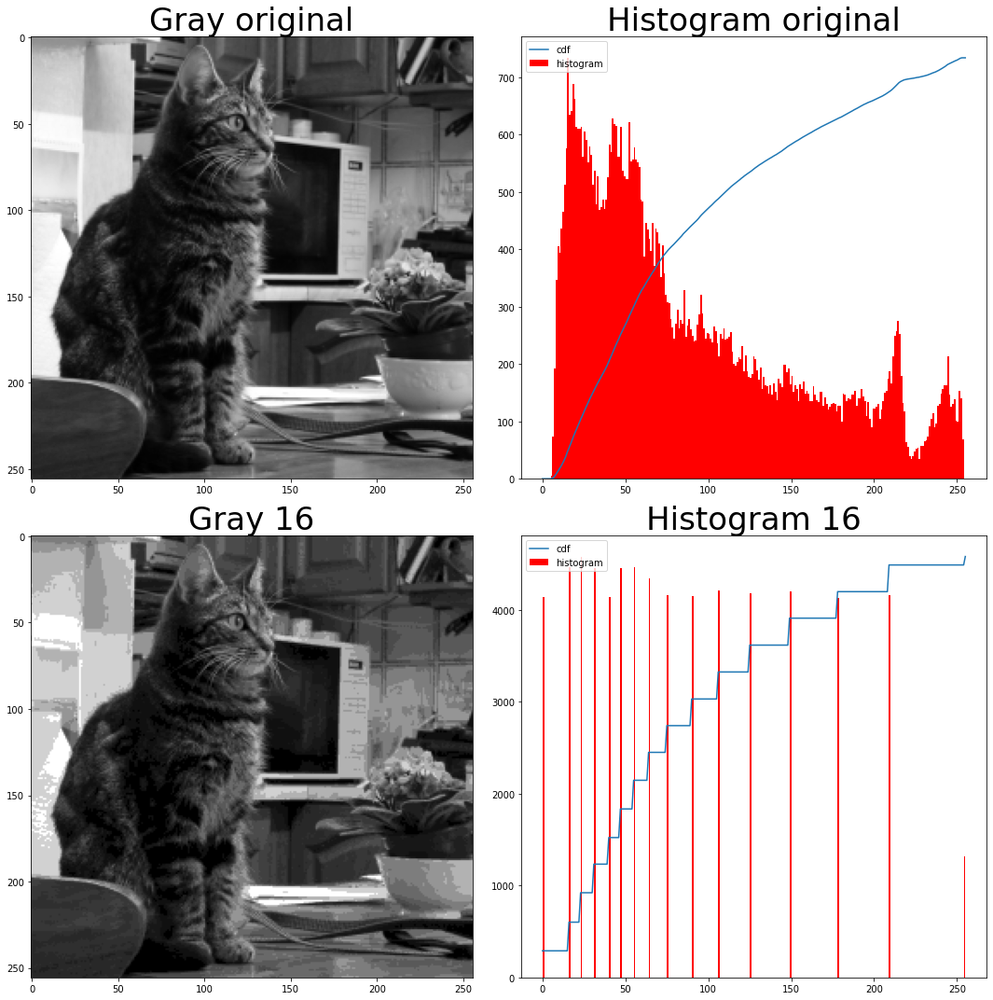

In [11]:
_ = q6(cat_gray, 16)

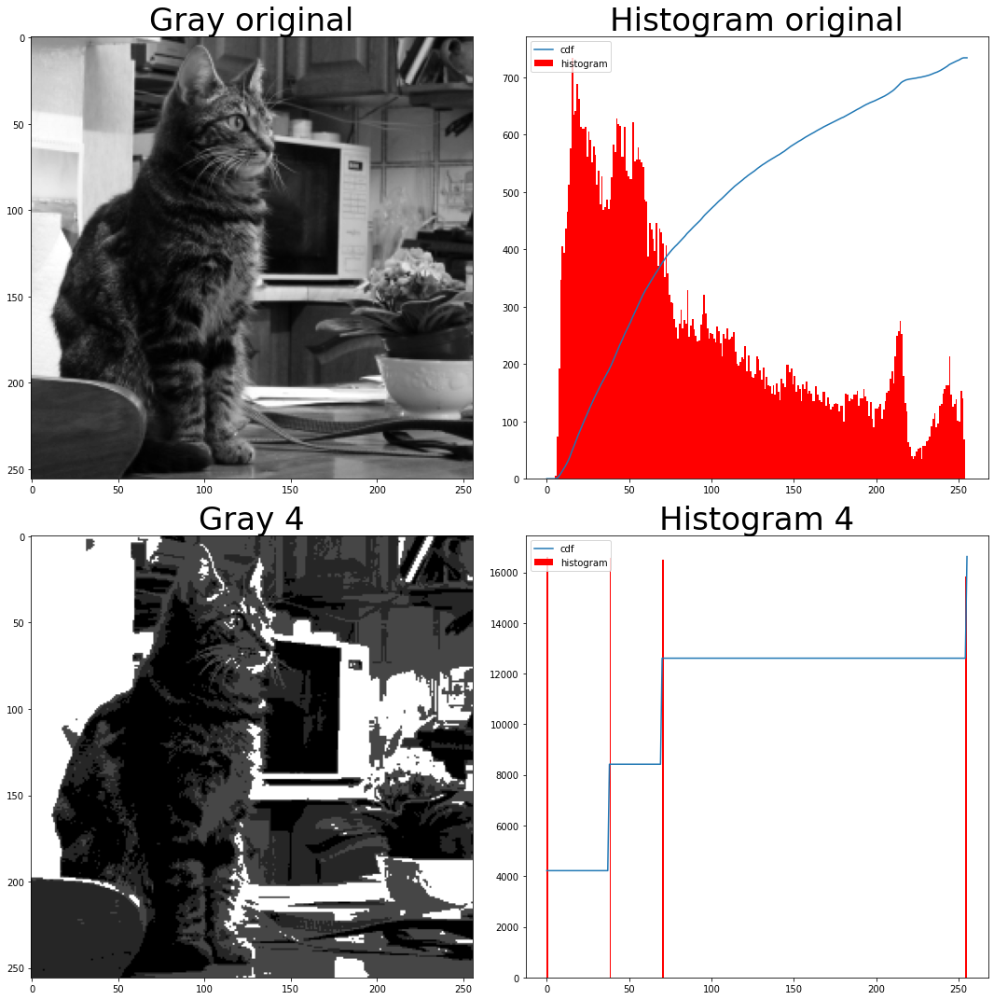

In [20]:
_ =q6(cat_gray, 4)

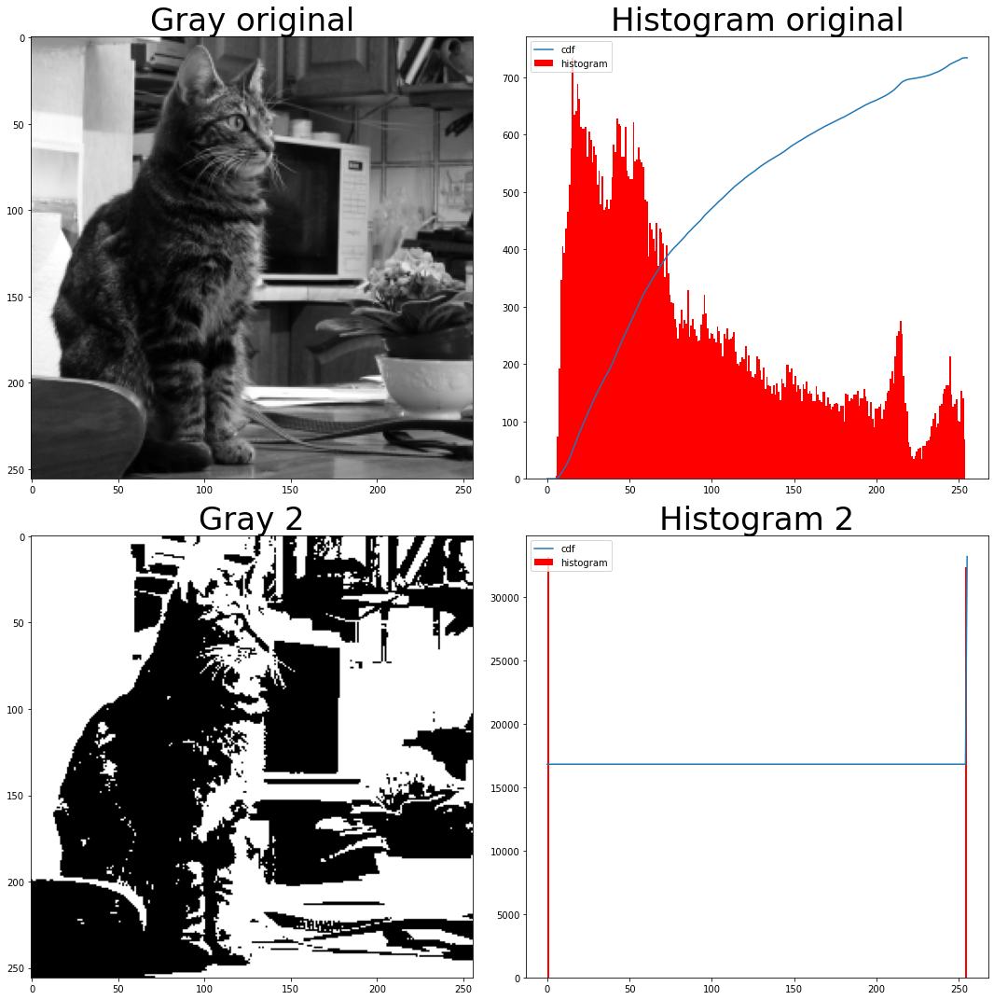

In [17]:
_ =q6(cat_gray, 2)

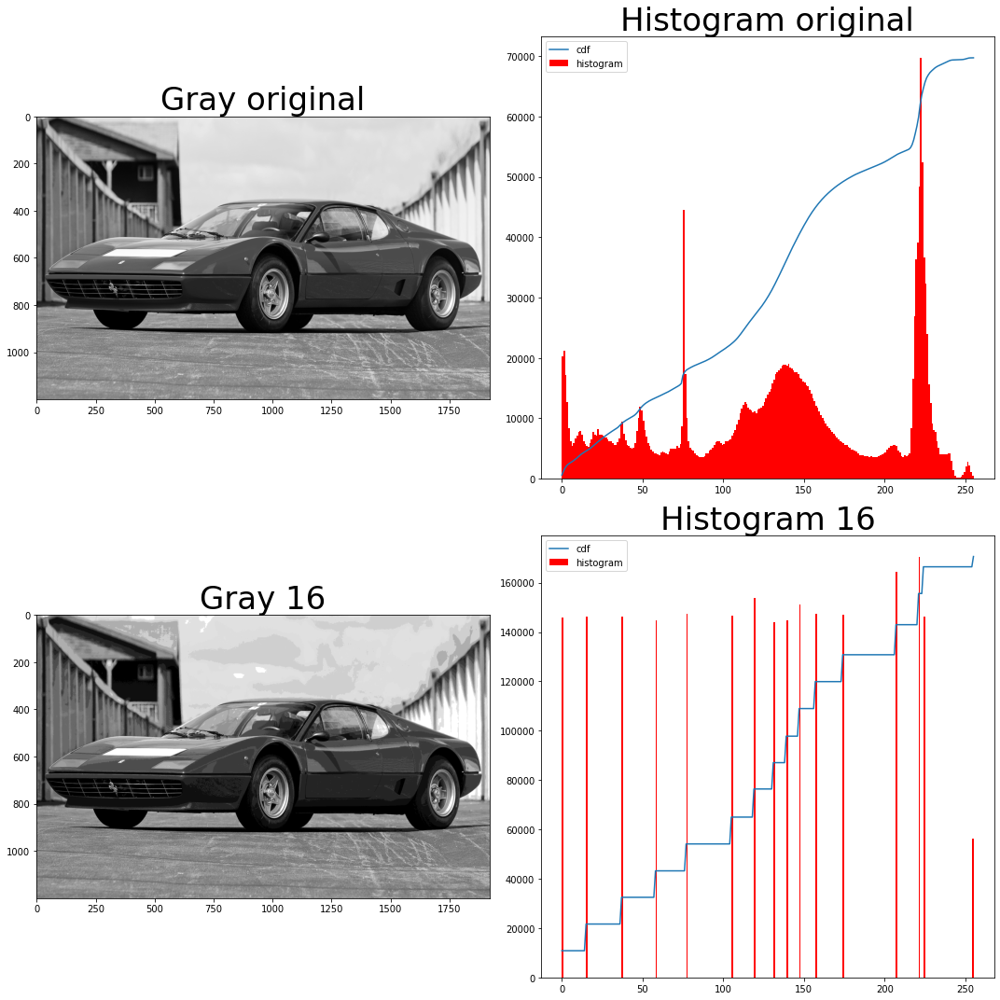

In [21]:
_ =q6(car_gray, 16) # Don't run this :(

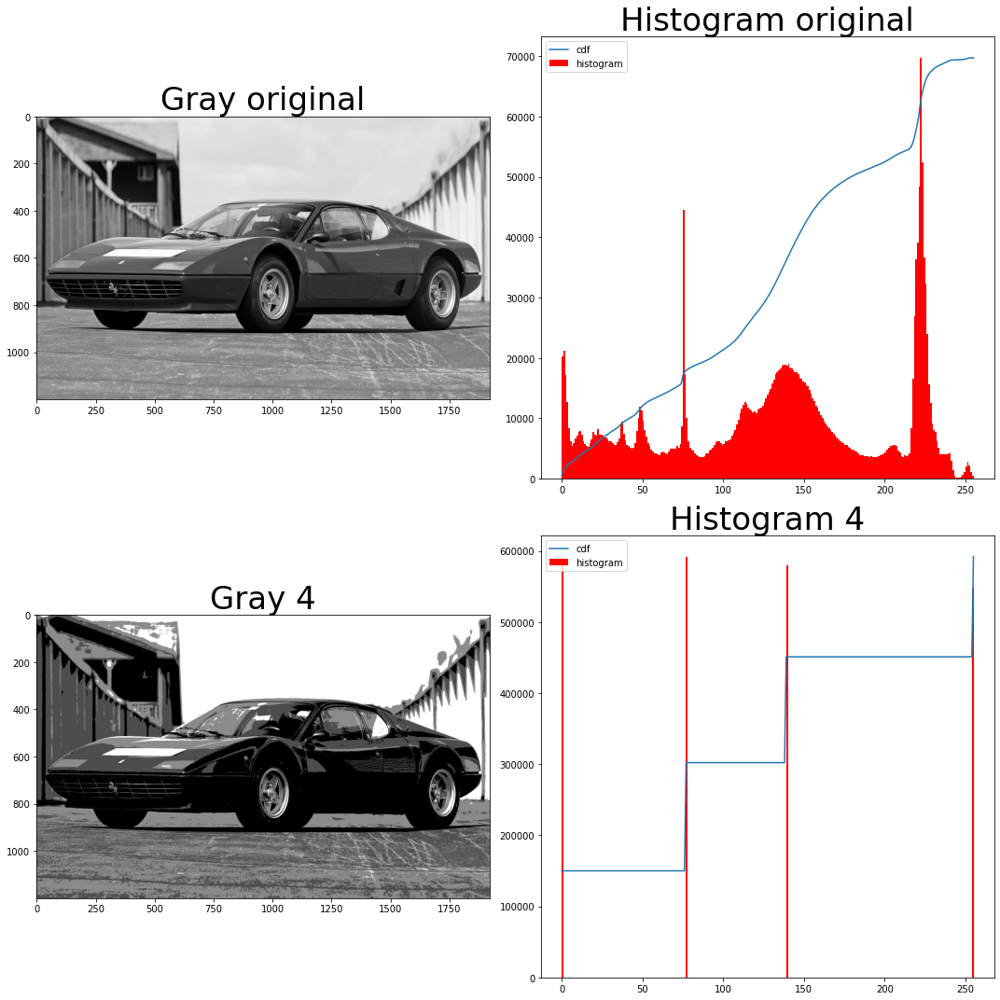

In [22]:
_ =q6(car_gray, 4) # Don't run this :(

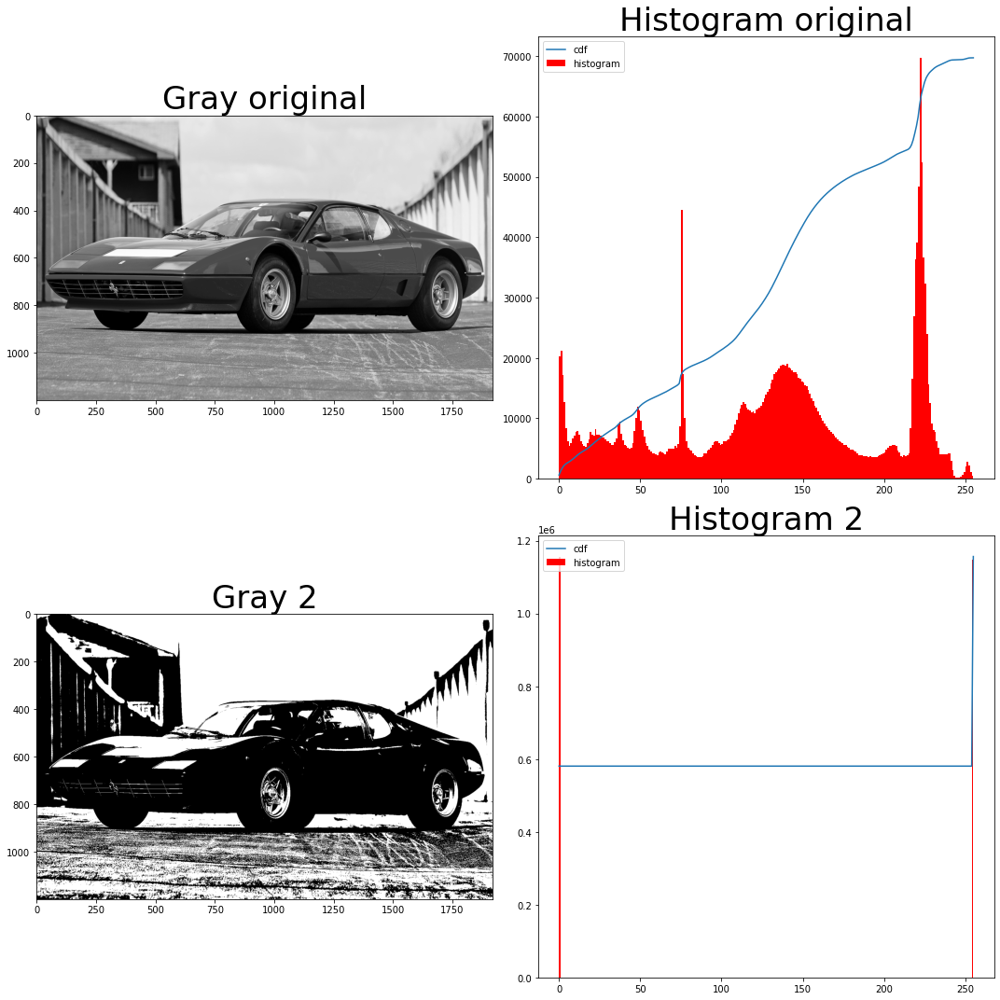

In [23]:
_ =q6(car_gray, 2) # Don't run this :(

## Q7
Use image p7q.jpg, apply histogram stretching and
equalization on that and show 3 images and 3 histograms.
(original, stretched, equalized)

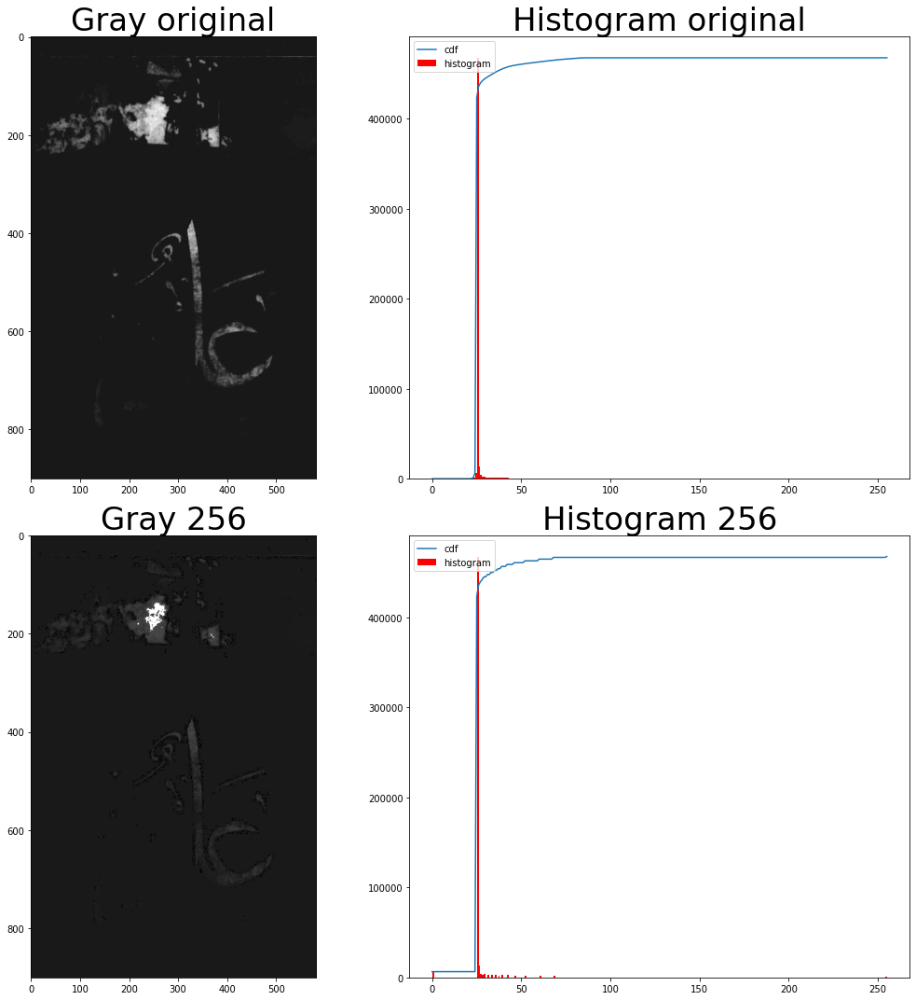

In [25]:
img = cv2.imread("p7q.jpg")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_equ = q6(img_gray, 256)

In [26]:
def q7(img_gray):
    source_gl = 256
    n_pixels = img_gray.size


    # image histogram
    hist,bins = np.histogram(img_gray.flatten(), source_gl, [0,source_gl])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    
    # graylevel reduction based on equalization
    output_img = cv2.equalizeHist(img_gray)

    hist2,bins2 = np.histogram(output_img.flatten(), source_gl, [0,source_gl])

    cdf2 = hist2.cumsum()
    cdf_normalized2 = cdf2 * hist2.max() / cdf2.max()


    fig, axs = plt.subplots(2,2, figsize=(15,15))
    axs[0,0].set_title(f"Gray original" ,fontsize = 34)
    axs[0,0].imshow(img_gray, cmap='gray')

    axs[0,1].set_title(f"Histogram original" ,fontsize = 34)
    axs[0,1].plot(cdf_normalized)
    axs[0,1].hist(img_gray.flatten(), 255, [0,255], color = 'r')
    axs[0,1].legend(('cdf','histogram'), loc = 'upper left')
    axs[1,0].set_title(f"Gray equalized" ,fontsize = 34)
    axs[1,0].imshow(output_img, cmap='gray')
    axs[1,1].set_title(f"Histogram equalized" ,fontsize = 34)
    axs[1,1].plot(cdf_normalized2)
    axs[1,1].hist(output_img.flatten(), 255, [0,255], color = 'r')
    axs[1,1].legend(('cdf','histogram'), loc = 'upper left')
    plt.tight_layout()


    return output_img

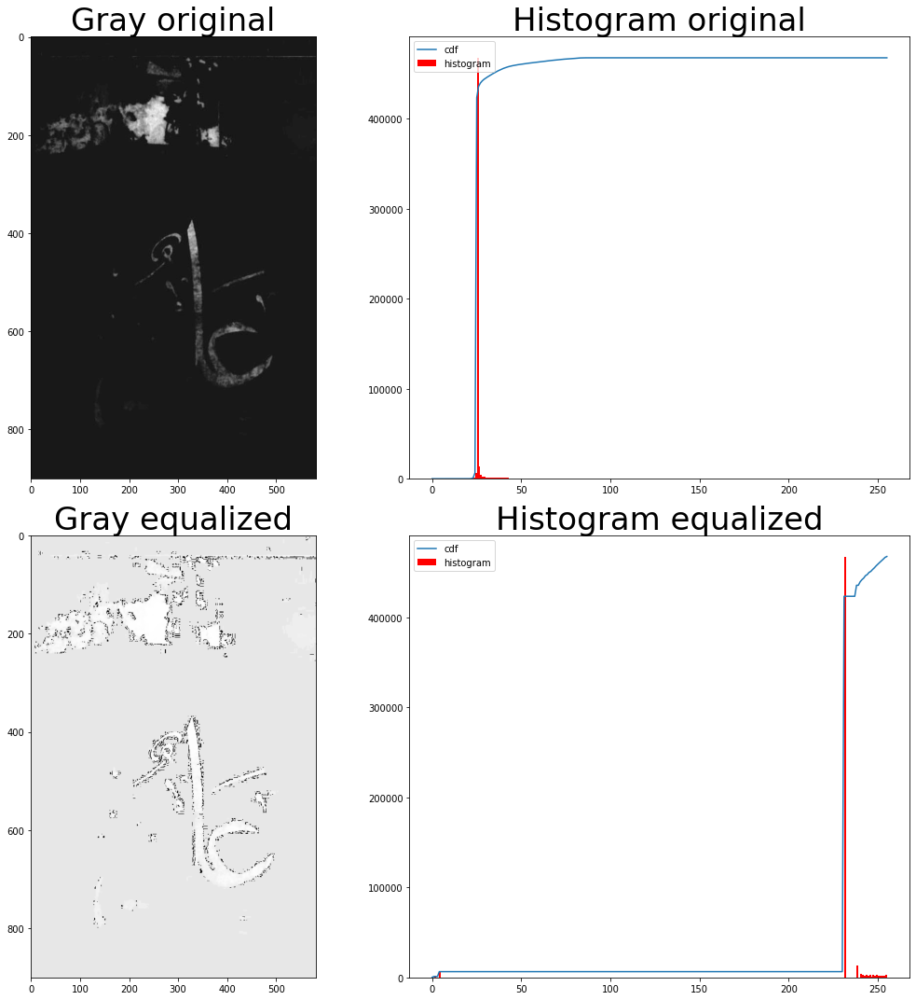

In [28]:
# stretching and showing the stretched image 
equ = q7(img_gray)

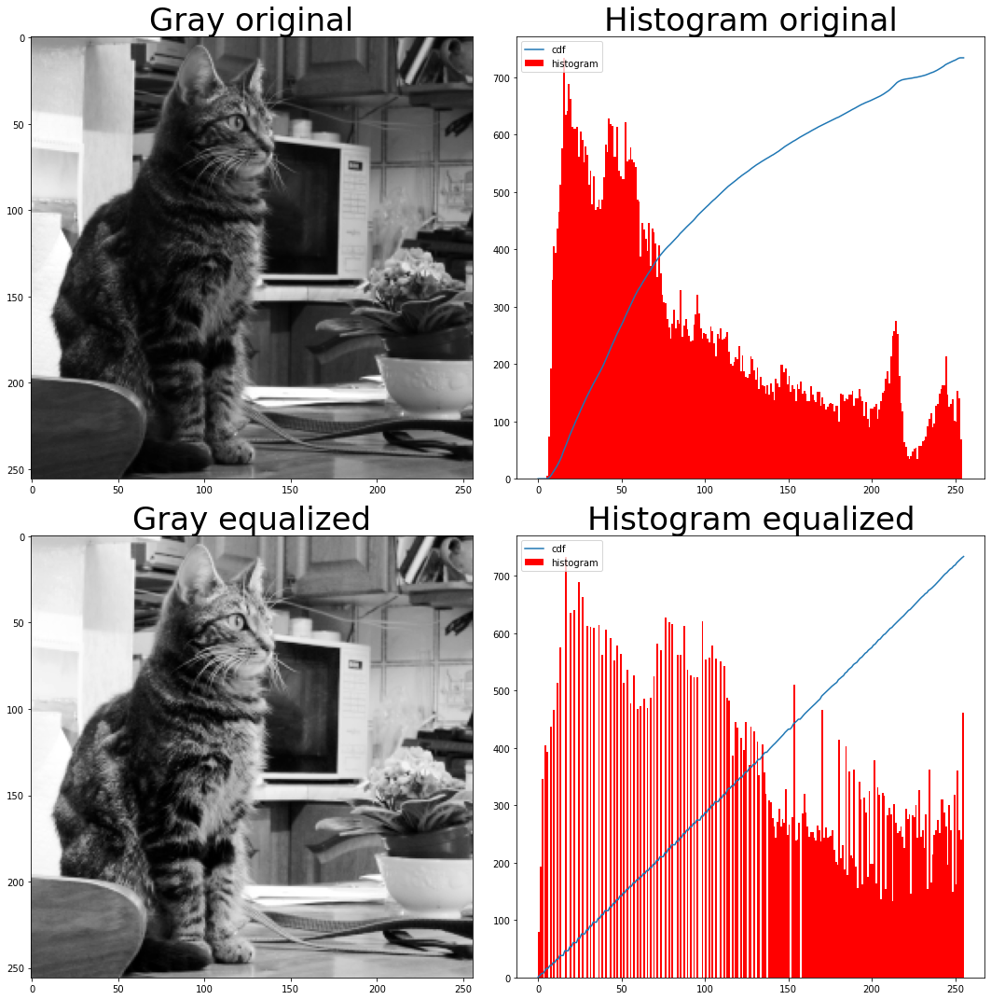

In [29]:
equ = q7(cat_gray)

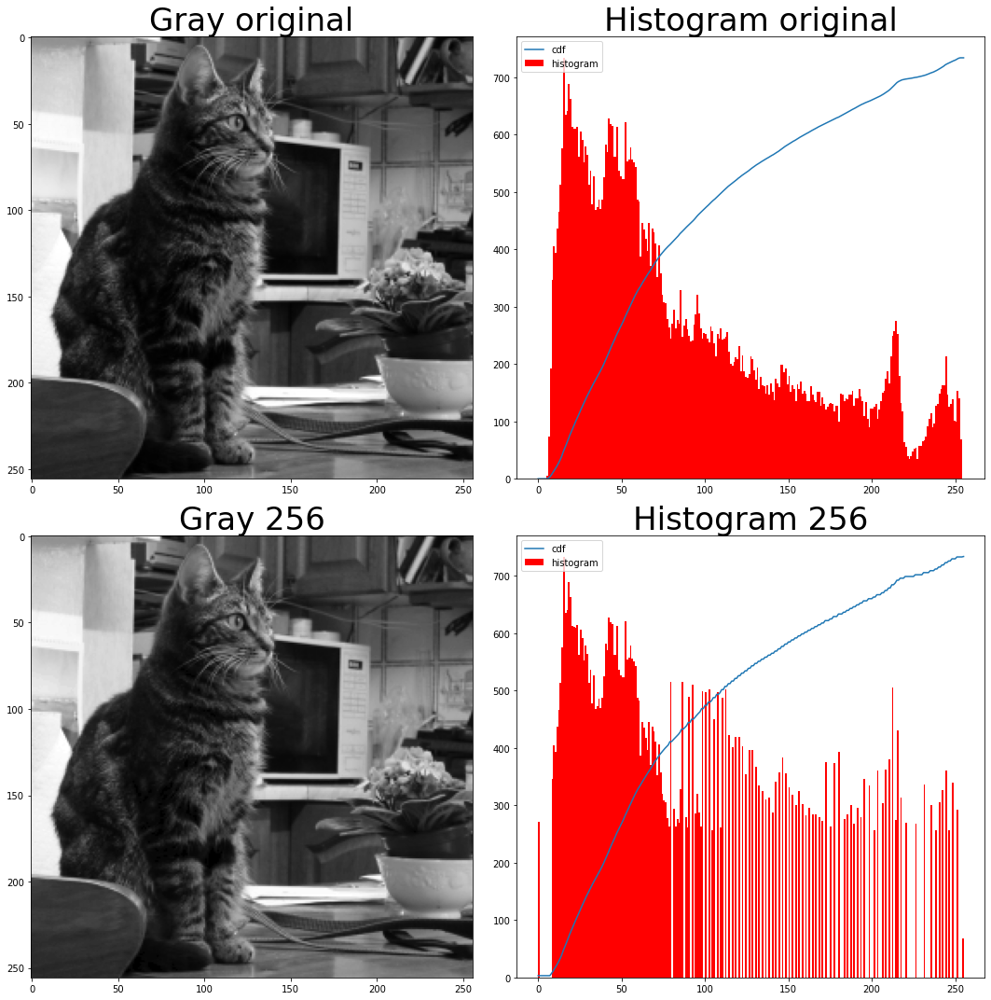

In [30]:
cat_256 = q6(cat_gray, 256)

## Q8
Develop a Python function that gets an image, a, and a
coefficient, nc, 0 < nc < 1, that determines the percentage of
dot noise, then add nc% dot/salt and pepper noise to your
image.

### Q8.1
Try that with image 20220406_120328gl.jpg with
nc=0.2 (20% of image pixels are now dot noises), show
the results.


In [12]:
import math as m
import cv2
import numpy as np
import random as rnd
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('20220406_120328gl.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
noisefct = 0.2

In [13]:
# configure the noise matrix
nnoise = np.ones_like(img)
# randomly select noisefct percent pixels of the noise matrix and make them 0
for i in range(int(img.size*noisefct) ):
    nnoise[np.random.randint(img.shape[0])][np.random.randint(img.shape[1])] = 0

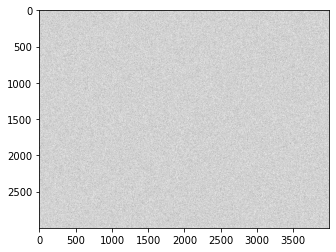

In [14]:
plt.imshow(nnoise, cmap='gray')

In [15]:
# dot production (element-wise multiplication) of the noise and image
# show the results
img_n = img*nnoise

In [16]:
cv2.imshow("compare", np.hstack((img,img_n)))
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [36]:
# plt.imsave("cw1_figs/q8_noise.png",np.hstack((img,img_n)),cmap='gray')

### Q8.2
Apply 3x3 and 5x5 median filters on the noisy image and
show the results. What do you think? DTR.

In [17]:
# median filtering, 1st para is the noisy image 
# 2nd para is the size of median filter, e.g., 7=a 7x7 median filter
median_3 = cv2.medianBlur(img_n, 3)
median_5 = cv2.medianBlur(img_n, 5)

In [18]:
cv2.imshow("compar3", np.hstack((img_n,median_3)))
cv2.waitKey()

cv2.imshow("compare5", np.hstack((img_n,median_5)))
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [40]:
# plt.imsave("cw1_figs/q8_2_filtered.png",np.vstack((np.hstack((img,img_n)), np.hstack((median_3,median_5)))),cmap='gray')

### Q8.3 
Compute, report, and discuss the Entropy of the original and noisy image.
- The noise decrease as we put only black spots in the image. But for some of the images it may have a increasing entropy first then decrease after. This depends on the content of the image and the noise we put.

In [43]:
print('Plain image Entropy :',am_entropy(img),'\nNoise image Entropy :',am_entropy(img_n))

Plain image Entropy : 7.721149539852669 
Noise image Entropy : 6.993472216754751


Check out this [answer](https://dsp.stackexchange.com/questions/38694/what-is-the-effect-of-noise-on-shannon-entropy)

## Q9
Use the gray level and noisy version of 2 images mentioned
in Question 3, (there are 4 noisy versions for each)
1. Apply hl1 and hl2 on noisy images. Discuss the results.
Compare the power.
2. Apply 3x3 and 5x5 median filters on the noisy image and
show the results. What do you think? DTR.

In [20]:
hl1 = np.ones((2,2))
hl1 = hl1/hl1.sum()
hl2 = np.ones((3,3))
hl2 = hl2/hl2.sum()

In [21]:
car_list = ["noisy_carpixel-1976-ferrari-512-bb-gauss_std_10.jpg",
                "noisy_carpixel-1976-ferrari-512-bb-gauss_std_20.jpg",
                "noisy_carpixel-1976-ferrari-512-bb-snp_nc10.jpg",
                "noisy_carpixel-1976-ferrari-512-bb-snp_nc20.jpg"]

cat_list = ["noisy_cat_snp_nc10.bmp",
            "noisy_cat_gauss_std10.bmp",
            "noisy_cat_guass_std20.bmp",
            "noisy_cat_snp_20.bmp"]

In [22]:
def q9_1(image_list, kernels, kernel_names):

    for im_path in image_list:
        img = cv2.imread(im_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        out_img = []
        out_img.append(img)
        message = f"Power of {im_path} orignal: {am_power(img)}"
        for i, kernel in enumerate(kernels):
            out_img.append(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))
            message += f", after {kernel_names[i]}: {am_power(out_img[i+1])}"

        plt.imsave(f"cw1_figs/q9_1_{kernel_names}_filtered_{im_path}.png",np.hstack(out_img), cmap='gray')
        
        print(message)

        
        

In [23]:
q9_1(car_list, [hl1, hl2], ['hl1', 'hl2'])

Power of noisy_carpixel-1976-ferrari-512-bb-gauss_std_10.jpg orignal: 24037.526896701387, after hl1: 23320.436196614584, after hl2: 23148.412552083333
Power of noisy_carpixel-1976-ferrari-512-bb-gauss_std_20.jpg orignal: 23591.197890625, after hl1: 22514.796067708332, after hl2: 22281.71649435764
Power of noisy_carpixel-1976-ferrari-512-bb-snp_nc10.jpg orignal: 20360.75668576389, after hl1: 18915.886518229167, after hl2: 18611.867166232638
Power of noisy_carpixel-1976-ferrari-512-bb-snp_nc20.jpg orignal: 18431.334575520832, after hl1: 15985.54631640625, after hl2: 15502.009115885417


In [48]:
def q9_2(image_list, med_sizes):

    for im_path in image_list:
        img = cv2.imread(im_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        out_img = []
        out_img.append(img)
        message = f"Power of {im_path} orignal: {am_power(img)}"
        for i, s in enumerate(med_sizes):
            out_img.append(cv2.medianBlur(img, med_sizes[i]))
            message += f", after median_{med_sizes[i]}: {am_power(out_img[i+1])}"

        plt.imsave(f"cw1_figs/q9_1_median_filtered_{im_path}.png",np.hstack(out_img),cmap='gray')
        
        print(message)

In [49]:
q9_2(car_list, [3, 5])

Power of noisy_carpixel-1976-ferrari-512-bb-gauss_std_10.jpg orignal: 24037.526896701387, after median_3: 23188.384672743057, after median_5: 22879.94120138889
Power of noisy_carpixel-1976-ferrari-512-bb-gauss_std_20.jpg orignal: 23591.197890625, after median_3: 22960.440500434026, after median_5: 22677.63009765625
Power of noisy_carpixel-1976-ferrari-512-bb-snp_nc10.jpg orignal: 20360.75668576389, after median_3: 22057.38037152778, after median_5: 21942.475826388887
Power of noisy_carpixel-1976-ferrari-512-bb-snp_nc20.jpg orignal: 18431.334575520832, after median_3: 21490.782008680555, after median_5: 21574.446587239585


In [50]:
q9_1(cat_list, [hl1, hl2], ['hl1', 'hl2'])

Power of noisy_cat_snp_nc10.bmp orignal: 11358.609161376953, after hl1: 10492.730438232422, after hl2: 10195.293182373047
Power of noisy_cat_gauss_std10.bmp orignal: 12462.386672973633, after hl1: 12111.828063964844, after hl2: 11892.34487915039
Power of noisy_cat_guass_std20.bmp orignal: 13215.531600952148, after hl1: 12341.241668701172, after hl2: 12065.997039794922
Power of noisy_cat_snp_20.bmp orignal: 10260.017379760742, after hl1: 8813.206527709961, after hl2: 8433.46337890625


In [51]:
q9_2(cat_list, [3,5])

Power of noisy_cat_snp_nc10.bmp orignal: 11358.609161376953, after median_3: 12122.585815429688, after median_5: 11896.063186645508
Power of noisy_cat_gauss_std10.bmp orignal: 12462.386672973633, after median_3: 12147.955825805664, after median_5: 11996.14486694336
Power of noisy_cat_guass_std20.bmp orignal: 13215.531600952148, after median_3: 12121.470657348633, after median_5: 11900.6181640625
Power of noisy_cat_snp_20.bmp orignal: 10260.017379760742, after median_3: 11602.708511352539, after median_5: 11351.609832763672


## Q10
Consider this filter, compare that with the Laplacian filter
and realize the differences. Why is it considered as a
Laplacian‐based image enhancer?

`kernel1 = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])`
                     
Recall \
`Laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])` \
or `Laplacian = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])`

In [24]:
image = cv2.imread('bris1.bmp')
# Print error message if image is null
if image is None:
    print('Could not read image')
# define the filter kernel 
kernel1 = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]]) 

image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
## how to use?
## cv.filter2D(	src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]]	) ->	dst

In [25]:
image2 = cv2.filter2D(src=image, ddepth=-1, kernel=kernel1)
# cv2.namedWindow("Original", cv2.WINDOW_NORMAL)
cv2.imshow('Original', image)
cv2.waitKey()
# cv2.namedWindow("Filtered", cv2.WINDOW_NORMAL)
cv2.imshow('Filtered', image2)
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)


-1

In [26]:
diff = np.uint8(np.abs(image-image2))
cv2.imshow('Difference', diff)
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)
# plt.imsave("cw1_figs/q10_bris1.jpg", np.hstack((image, image2, diff)))

-1

In [27]:
image = cv2.imread('01a_amusementpark.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image2 = cv2.filter2D(src=image, ddepth=-1, kernel=kernel1)
image3 = cv2.Laplacian(src=image, ddepth=-1, ksize=3)

# cv2.namedWindow("Original", cv2.WINDOW_NORMAL)
cv2.imshow('Original', image)
cv2.waitKey()
# cv2.namedWindow("Filtered", cv2.WINDOW_NORMAL)
cv2.imshow('Filtered', image2)
cv2.waitKey()
cv2.imshow('Laplacian', image3)
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [66]:
diff = np.uint8(np.abs(image-image2))
cv2.imshow('Difference', diff)
cv2.waitKey()
cv2.destroyAllWindows()
cv2.waitKey(1)
# plt.imsave("cw1_figs/q10_01a_amusementpark.jpg", np.hstack((image, image2, diff)))

-1

## Q11
Develop a Python program to apply unsharp masking on the
images below. Show the results. Use hl2 as your lowpass
filter.
* 20220406_120328gl.jpg
* 20220511_105950gl.jpg
* Arge_Bam3_bw.bmp

In [28]:
import cv2
import numpy as np

img_1 = cv2.imread('20220406_120328gl.jpg')
img_2 = cv2.imread('20220511_105950gl.jpg')
img_3 = cv2.imread('Arge_Bam3_bw.bmp')
# Print error message if image is null
if img_1 is None or img_2 is None or img_3 is None:
    print('Could not read image')

# define the filter kernel 
hl2 = np.ones([3,3]) /9

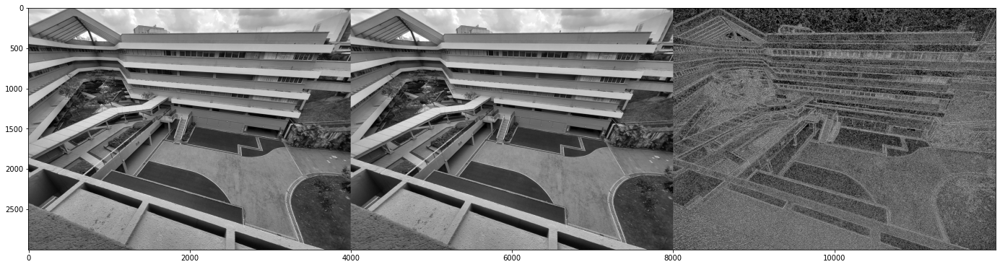

In [29]:
img_1_f = cv2.filter2D(src=img_1, ddepth=-1, kernel=hl2)
usharp = np.uint8(np.abs(img_1-img_1_f))
plt.figure(figsize=(24, 8))
plt.imshow(np.hstack((img_1, img_1_f, usharp)))
# plt.imsave("cw1_figs/q11_20220406_120328gl.png", np.hstack((img_1, img_1_f, usharp)))


In [72]:
print(img_1.shape)
image = am_valid_part(img_1, 3)
image2 = am_valid_part(img_1_f, 3)
usharp = am_valid_part(usharp, 3)
print(image.shape)

(3000, 4000, 3)
(2998, 3998, 3)


In [73]:
image = am_valid_part(img_1,3)
print('Original image power=', f"{am_power(img_1):,}")
print('Filtered image power=', f"{am_power(img_1_f):,}")
print('Unsharp masked image power=', f"{am_power(usharp):,}")

Original image power= 16,908.078230333333
Filtered image power= 16,821.135401
Unsharp masked image power= 23,019.861442812802


In [33]:
def am_valid_part_dim1(a,N=3):
    cff = int(N/2)
    M = a.shape
    return a[cff:M[0]-cff, cff:M[1]-cff]

## Q12
Develop a complete Sobel edge detection algorithm and
apply that to Question 10 images. Compute and compare
the power of the input and output images. Mention the
parameters that you use as well.

In [31]:
image = cv2.imread('06600600u.bmp')
# Print error message if image is nul
# thr decides edges that we wanna keep in the final output. edges stronger than thr*maximum_strength would be kept. 
# e.g., thr = 0.7, edgest with strength higher than 0.7*maximum_strength would be kept
thr = 0.95
if image is None:
    print('Could not read image')
# define the filter kernels 
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
hsx = np.array([[-1 , 0 , 1] , [-2 , 0 , 2] , [-1 , 0 , 1]])
hsy = np.array([[-1 , -2 , -1] , [0 , 0 , 0] , [1 , 2 , 1]])


In [34]:
# horizontal and vertical edge detection
Gx = cv2.filter2D(src=image, ddepth=-1, kernel=hsx)
Gy = cv2.filter2D(src=image, ddepth=-1, kernel=hsy)
Gx = am_valid_part_dim1(Gx,3)
Gy = am_valid_part_dim1(Gy,3)

# showing the results
cv2.namedWindow("Original", cv2.WINDOW_NORMAL)
cv2.imshow('Original', image)
cv2.namedWindow("Gx", cv2.WINDOW_NORMAL)
cv2.imshow('Gx', Gx)
cv2.namedWindow("Gy", cv2.WINDOW_NORMAL)
cv2.imshow('Gy', Gy)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)


-1

In [35]:
# horizontal and vertical edge detection
Gx = cv2.filter2D(src=image, ddepth=-1, kernel=hsx)
Gy = cv2.filter2D(src=image, ddepth=-1, kernel=hsy)
Gx = am_valid_part_dim1(Gx,3)
Gy = am_valid_part_dim1(Gy,3)

Gsq = np.power((np.power(Gx,2) + np.power(Gy,2)) , 0.5)
Gdir = np.arctan( Gy/(Gx+0.00001) ) # smoothing to prevent Gx being 0
Gabs = (np.abs(Gx) + np.abs(Gy)) / 2

xy = np.hstack(( Gx, Gy))
cv2.imshow('XY', xy)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

sq_comp = np.hstack((Gsq / Gsq.max(), np.uint8( (Gsq >= (Gsq.max()*thr)) * 255)))
cv2.imshow('Sqrt Compare', sq_comp)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

dir_comp = np.hstack((Gdir / Gdir.max(), np.uint8( (Gdir >= (Gdir.max()*thr)) * 255)))
cv2.imshow('Dir Compare', dir_comp)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

abs_comp = np.hstack((Gabs / Gabs.max(), np.uint8( (Gabs >= (Gabs.max()*thr)) * 255)))
cv2.imshow('Abs Compare', abs_comp)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [16]:
# plt.imsave("cw1_figs/q12_06600600u_xy.png", np.hstack(( Gx, Gy)))
# plt.imsave("cw1_figs/q12_06600600u_Gabs.png", np.hstack(( Gabs/Gabs.max(), Gabs>(Gabs.max()*thr))))
# plt.imsave("cw1_figs/q12_06600600u_Gdir.png", np.hstack(( Gdir/Gdir.max(), Gdir>(Gdir.max()*thr))))
# plt.imsave("cw1_figs/q12_06600600u_Gsum.png", np.hstack(( Gsum/Gsum.max(), Gsum>(Gsum.max()*thr))))